### First let's create a set of world control points for the LSD Bridge

This is pretty obnoxious -- must be done in geopandas, which is not super compatible with cv2...

In [1]:
geo_dir = "/media/jsaxon/brobdingnag/data/cv/geo/"

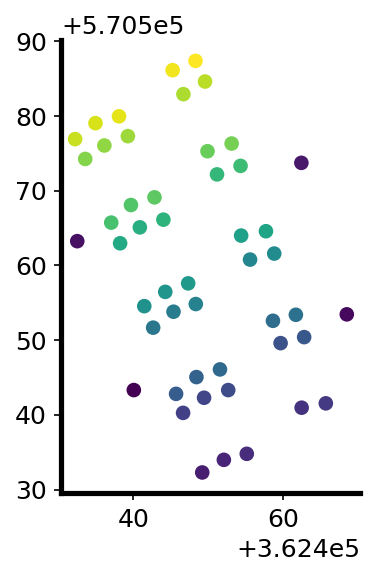

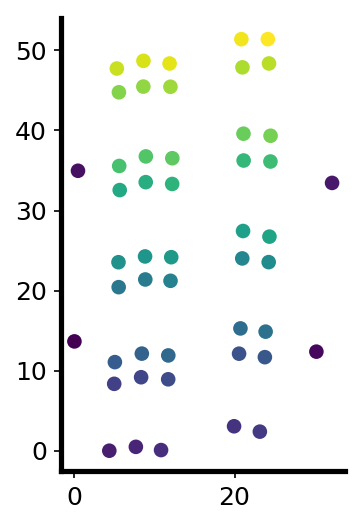

In [2]:
df = pd.read_csv(geo_dir + "lsd.csv")

geometry = gpd.GeoSeries([Point(xy) for xy in zip(df.lat, df.lon)], crs = from_epsg(4326))

gdf = gpd.GeoDataFrame(data = df[["id"]], geometry = geometry)
gdf.to_crs(epsg = 3528, inplace = True)
gdf["idx"] = gdf.index

gdf.plot(column = "idx")


gdf.set_geometry(gdf.geometry.rotate(-22, origin = (0, 0, 0)), inplace = True)

bbox = gdf.unary_union.bounds[:2]
gdf.set_geometry(gdf.geometry.translate(xoff = -bbox[0], yoff = -bbox[1]), inplace = True)
gdf.plot(column = "idx")

In [3]:
gdf["x"] = gdf.geometry.apply(lambda x: x.coords[0][0])
gdf["y"] = gdf.geometry.apply(lambda x: x.coords[0][1])

In [4]:
gdf[["id", "x", "y"]].to_csv(geo_dir + "lsd_local.csv", index = False)

### Now figure out where the camera was.

In [9]:
import cv2
from PIL import Image

show_image = lambda x : Image.fromarray(cv2.cvtColor(x, cv2.COLOR_BGR2RGB))

In [10]:
vid_dir = "../../../data/cv/vid/"
geo_dir = "/media/jsaxon/brobdingnag/data/cv/geo/"

In [11]:
locations = pd.read_csv(geo_dir + "lsd_e_20200131.csv")
locations["z"] = 0

locations.head()

,id,x,y,xp,yp,z
0,le1,30.222598,12.374511,2702.0,1036.0,0
1,lw2,0.445281,34.966935,683.2,604.8,0
2,le2,32.181765,33.448957,2298.8,590.8,0
3,ea0n,19.941471,3.053821,1346.8,1946.0,0
4,eb0n,23.160674,2.382699,2088.8,1954.4,0


In [12]:
stream = cv2.VideoCapture(vid_dir + "lsd_e_20200131.mov")
ret, img = stream.read()
stream.release()

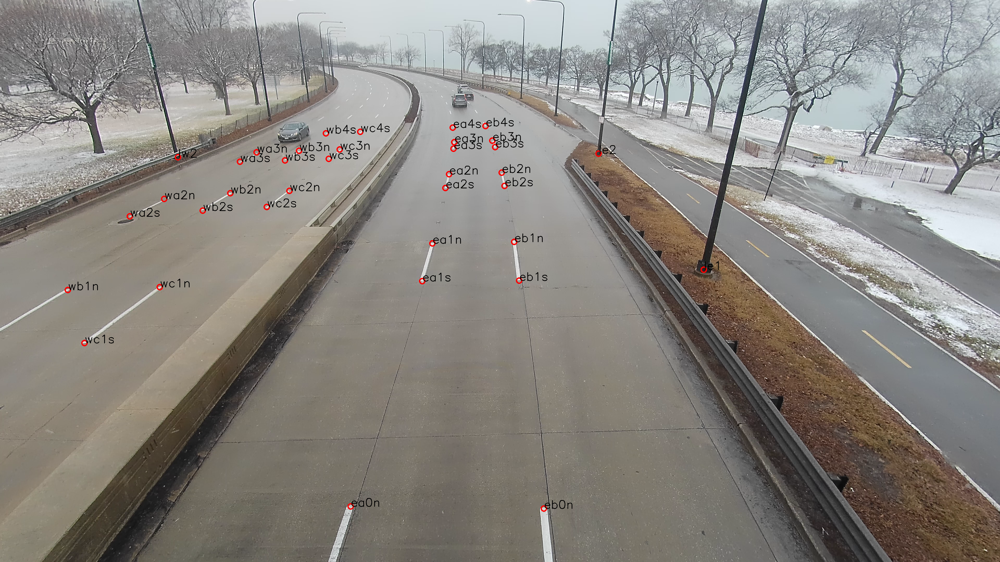

In [13]:
img_pts = img.copy()
for _, row in locations.iterrows():

    if row.xp is None or row.yp is None: continue

    coords = (int(row.xp), int(row.yp))
    cv2.circle(img_pts, coords, 10, (0, 0, 255), 3)
    cv2.putText(img_pts, row.id, coords, cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 0, 0), 2)

show_image(img_pts)

In [14]:
matrix     = np.load('../../../data/cv/calib/A/K.npy')
distortion = np.load('../../../data/cv/calib/A/dist.npy')

In [15]:
req = (locations.x > 15) & (locations.y < 35) # just northbound

print(locations.loc[req, ["x", "y", "z"]].shape)

_, rvec, tvec = cv2.solvePnP(locations.loc[req, ["x", "y", "z"]].values,
                             locations.loc[req, ["xp", "yp"]].values,
                             matrix, distortion)

(12, 3)


In [16]:
proj = np.concatenate((cv2.Rodrigues(rvec)[0], tvec), axis=1)
proj = np.concatenate((proj, np.array([[0, 0, 0, 1]])), axis = 0)

# Invert this to get the camera positions.
camera_coords = np.array([np.linalg.inv(proj)[:3,3]]).ravel()

camera_coords

array([22.39118521, -3.96830472,  6.58947035])

### This seems fairly accurate...

Though I would have said I was more at like (x, y) = (21, -3).  This may be related to the rake of the highway.

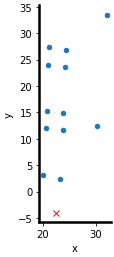

In [17]:
ax = locations[req].plot(x = "x", y = "y", kind = "scatter")
ax.plot(camera_coords.ravel()[0], camera_coords.ravel()[1], marker = "x", color = "red")

ax.set_aspect("equal")

for s in ["right", "top"]: ax.spines[s].set_visible(False)

Pixels count down from the top -- super confusing.

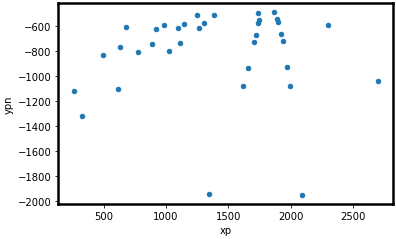

In [18]:
locations["ypn"] = -locations["yp"]
ax = locations.plot(x = "xp", y = "ypn", kind = "scatter")
ax.set_aspect(1)

In [19]:
projected, _ = cv2.projectPoints(locations.loc[req, ["x", "y", "z"]].values, 
                                 rvec, tvec, matrix, distortion)

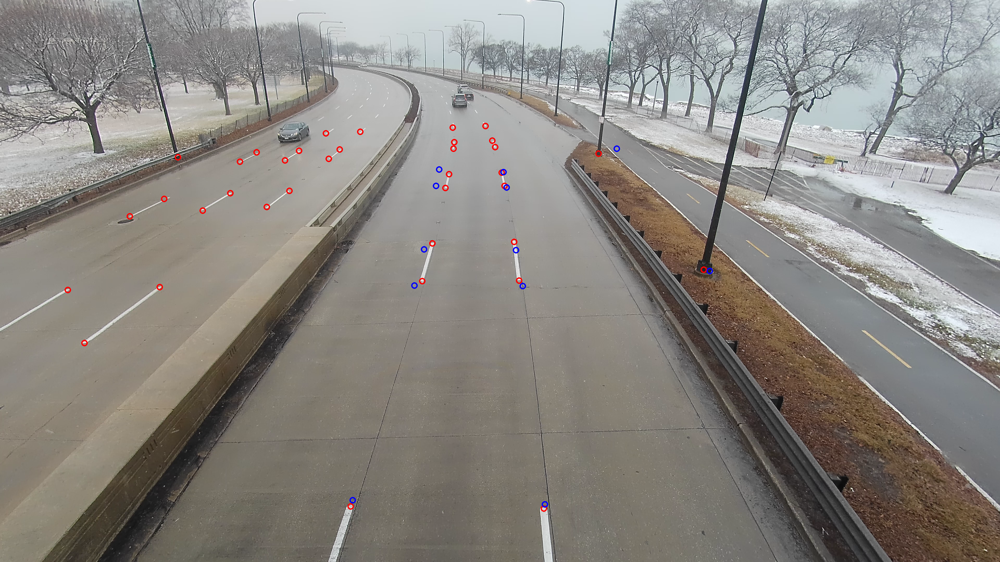

In [20]:
img_pts = img.copy()

for _, row in locations.dropna().iterrows():

    cv2.circle(img_pts, (int(row.xp), int(row.yp)), 10, (0, 0, 255), 3)
    

for xy in np.reshape(projected, (-1, 2)).astype(int):

    cv2.circle(img_pts, tuple(xy), 10, (255, 0, 0), 3)

show_image(img_pts)

### Now let's put in some detected cars.

In [21]:
cars = pd.read_csv(vid_dir + "lsd_e_20200131.csv")
cars['yn'] = -cars["y"]
cars["z"] = 0

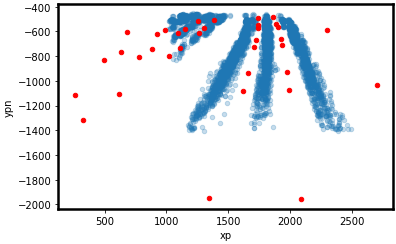

In [24]:
ax = cars.plot(x = "x", y = "yn", kind = "scatter", alpha = 0.25)

locations.plot(x = "xp", y = "ypn", kind = "scatter", ax = ax, color= "red")

ax.set_aspect(1)

### Now let's project them.

We'll also need to find the intersection with the ground plane.

https://rosettacode.org/wiki/Find_the_intersection_of_a_line_with_a_plane#Python

The intuition is that the dot product of the sum of 

1. The camera coordinate plus
2. a scaling our ray such that it intersects the ground plane

will go from the orign to the camera and then back to the ground plane.  At that point a dot productof this sum with the vector normal to the ground plane will be zero.  This tells us how far we have to go along the ray, and it tells us our intersection with the ground plane.

http://geomalgorithms.com/a05-_intersect-1.html

In [123]:
def ray_point_in_ground_plane(ray_vec, camera_coord,  
                              plane_point = np.zeros(3), 
                              plane_normal = np.array([0, 0, 1.0]), epsilon = 1e-6):
 
    norm_dot_ray = plane_normal.dot(ray_vec)
    if abs(norm_dot_ray) < epsilon:
        raise RuntimeError("no intersection or line is within plane")
 
    w = camera_coord - plane_point
    scale = -plane_normal.dot(w) / norm_dot_ray
    intersect = w + scale * ray_vec + plane_point

    return intersect

We'll also need the ray coming out of the camera.  We can get this off of the camera intrinsics....

https://stackoverflow.com/questions/12977980/in-opencv-converting-2d-image-point-to-3d-world-unit-vector

```
cv::Matx31f hom_pt(point_in_image.x, point_in_image.y, 1);
hom_pt = camera_intrinsics_mat.inv()*hom_pt; //put in world coordinates

cv::Point3f origin(0,0,0);
cv::Point3f direction(hom_pt(0),hom_pt(1),hom_pt(2));

//To get a unit vector, direction just needs to be normalized
direction *= 1/cv::norm(direction);
```

**This is our test point.**

In [143]:
locations.loc[locations["id"].str.contains("ea")]

,id,x,y,xp,yp,z,ypn
3,ea0n,19.941471,3.053821,1346.8,1946.0,0,-1946.0
6,ea1s,20.564832,12.119756,1621.2,1080.8,0,-1080.8
10,ea1n,20.736002,15.275536,1660.4,935.2,0,-935.2
15,ea2s,20.964574,24.019467,1710.8,722.4,0,-722.4
20,ea2n,21.062510,27.442849,1724.8,669.2,0,-669.2
25,ea3s,21.136442,36.247692,1741.6,571.2,0,-571.2
30,ea3n,21.116352,39.598187,1744.4,546.0,0,-546.0
34,ea4s,20.986761,47.886309,1738.8,490.0,0,-490.0


In [125]:
xp, yp = 1346.8, 1946.0

In [126]:
hom = cv2.convertPointsToHomogeneous(np.array([[xp, yp]])).ravel()

ray_vec = np.dot(np.linalg.inv(matrix), hom.ravel())  # Intrinsics...
ray_vec = np.dot(cv2.Rodrigues(rvec)[0].T, ray_vec)   # Inverse rotate (transpose) to world frame.
ray_vec /= np.linalg.norm(ray_vec)
print(ray_vec)

ground_point = ray_point_in_ground_plane(ray_vec, camera_coords)

ground_point

[-0.24422704  0.69994825 -0.67113754]


array([1.99932761e+01, 2.90403958e+00, 8.88178420e-16])

And then vectorize the ray_point_in_ground_plane

In [179]:
def vec_ray_point_in_ground_plane(ray_vec, camera_coord,  
                                  plane_point = np.zeros(3), 
                                  plane_normal = np.array([0, 0, 1.0]), epsilon = 1e-6):
 
    norm_dot_ray = plane_normal.dot(ray_vec)
    if any(np.abs(norm_dot_ray) < epsilon):
        raise RuntimeError("no intersection or line is within plane")
 
    w = camera_coord - plane_point
    scale = -plane_normal.dot(w) / norm_dot_ray
    
    intersect = w[:,np.newaxis] + scale * ray_vec + plane_point[:,np.newaxis]

    return intersect

def get_ground_points(pixel_coords, K, R):

    hom = cv2.convertPointsToHomogeneous(pixel_coords).reshape((-1, 3)).T

    ray_vec = np.dot(np.linalg.inv(K), hom)  # Intrinsics...
    ray_vec = np.dot(R.T, ray_vec)   # Inverse rotate (transpose) to world frame.
    ray_vec /= np.linalg.norm(ray_vec, axis = 0)

    ground_point = vec_ray_point_in_ground_plane(ray_vec, camera_coords)
    
    return ground_point[:2].T

In [181]:
ground_points = get_ground_points(pixel_coords, matrix, cv2.Rodrigues(rvec)[0])

In [182]:
northbound["xw"] = ground_points.T[0]
northbound["yw"] = ground_points.T[1]

northbound.head()

,id,x,y,xp,yp,z,ypn,xw,yw
3,ea0n,19.941471,3.053821,1346.8,1946.0,0,-1946.0,19.993276,2.904040
4,eb0n,23.160674,2.382699,2088.8,1954.4,0,-1954.4,23.134577,2.291387
6,ea1s,20.564832,12.119756,1621.2,1080.8,0,-1080.8,20.884631,12.160318
7,eb1s,23.788119,11.685781,1993.6,1078.0,0,-1078.0,23.735552,11.955482
10,ea1n,20.736002,15.275536,1660.4,935.2,0,-935.2,21.134469,15.382080


In [184]:
car_ground_points = get_ground_points(cars[["x", "ymin"]].values, matrix, cv2.Rodrigues(rvec)[0])

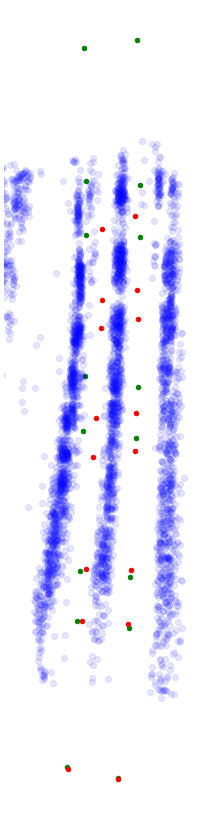

In [195]:
fig, ax = plt.subplots(figsize = (15, 15))

northbound.plot(kind = "scatter", x = "x",  y = "y",  color = "g", ax = ax)
northbound.plot(kind = "scatter", x = "xw", y = "yw", color = "r", ax = ax)

ax.scatter(car_ground_points.T[0], car_ground_points.T[1], color = "b", alpha = 0.1)

ax.set_xlim(16, 28)
ax.set_aspect("equal")

ax.set_axis_off()